# Use of the `Impute.jl` package to impute missing values in a simulated dataset

In the last notebook, we explored how to utilize mean imputation and median imputation in Julia to deal with missing values in a simulated dataset.

We created a simulated dataset using `DataFrames`, `Random`, and `Distributions`.  In this exercise, we will use the same data (code will be included to create the data again), and we will utilize a package that contains more robust algorithms to deal with missing values and better impute values that will approximate the distribution of the original data.

## Setup

In [85]:
# Install necessary packages
using Pkg
Pkg.add(["DataFrames", "Statistics", "StatsPlots", "Plots", "Random", "Distributions", "Impute", "Measures"])

# Load required packages
using DataFrames, Statistics, StatsPlots, Plots, Distributions, Random, Impute, Measures


   Resolving package versions...
  No Changes to `C:\Users\nfoss\.julia\environments\v1.10\Project.toml`
  No Changes to `C:\Users\nfoss\.julia\environments\v1.10\Manifest.toml`


## Generate the simulated data

In [2]:
# Set a seed for reproducibility
Random.seed!(123)

# Helper function to add missing values with a given probability
function add_missing(data, missing_prob=0.05)
    return [rand() < missing_prob ? missing : x for x in data]
end

# Generate data for 10,000 rows
ID = 1:10000  # Numeric data (IDs)

# Categorical data
Category = [rand(["A", "B", "C"]) for _ in 1:10000]

# Generate normally distributed Score and apply missing values
Score = add_missing(rand(Normal(75, 25), 10000))

# Generate bimodal Age distribution and apply missing values
Age = vcat(rand(Normal(25, 5), 5000), rand(Normal(45, 5), 5000))
Age = add_missing(Age)

# Generate Status with some missing values
Status = add_missing([rand(["Active", "Inactive"]) for _ in 1:10000])

# Create the DataFrame
test_df = DataFrame(ID=ID, Category=Category, Score=Score, Age=Age, Status=Status)

# Display the first few rows of the test DataFrame
describe(test_df, :all)

Row,variable,mean,std,min,q25,median,q75,max,sum,nunique,nuniqueall,nmissing,nnonmissing,first,last,eltype
,Symbol,Union…,Union…,Any,Union…,Union…,Union…,Any,Union…,Union…,Int64,Int64,Int64,Any,Any,Type
1,ID,5000.5,2886.9,1,2500.75,5000.5,7500.25,10000,50005000,,10000,0,10000,1,10000,Int64
2,Category,,,A,,,,C,,3,3,0,10000,B,B,String
3,Score,74.5147,25.124,-16.8624,57.5315,74.4757,91.3581,178.623,7.06996e5,,9488,512,9488,91.4752,58.6367,"Union{Missing, Float64}"
4,Age,35.0448,11.1947,7.97581,24.9507,35.0363,45.0404,62.1862,333241.0,,9509,491,9509,22.372,49.0142,"Union{Missing, Float64}"
5,Status,,,Active,,,,Inactive,,2,2,506,9494,Active,Inactive,"Union{Missing, String}"


## Let's visualize the missingness

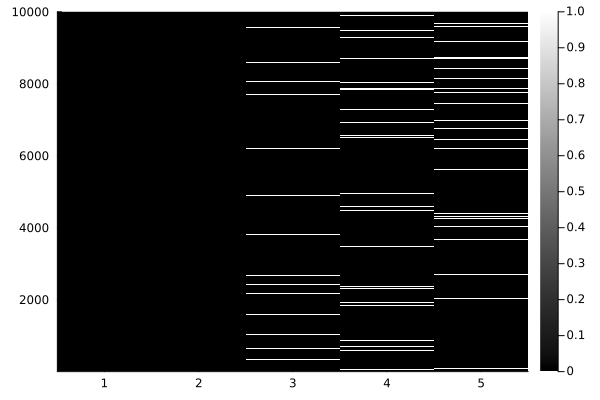

In [193]:
# use a heatmap to visualize the missingness in the data

heatmap(Matrix(ismissing.(test_df)), color = :greys)

## Check the distribution of the original data

There is systematic missingness present within this dataset.  Downstream processing will suffer promised limitations if we do not fix this!

Let's try some different approaches using the `Impute.jl` package.

First, let's take a look at the distribution of the original data.

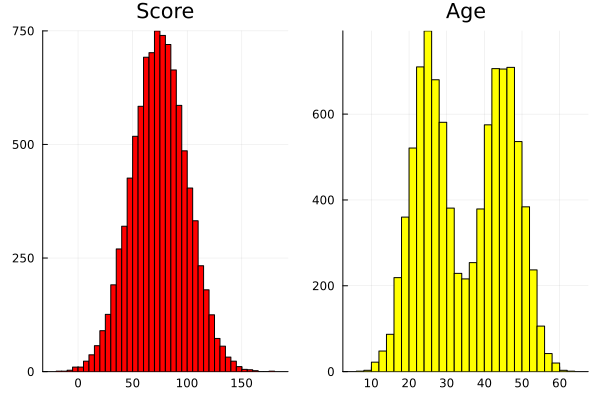

In [3]:
# visualize the distribution of the numeric variables to examine their distribution without imputing the missing values

h1 = histogram(test_df.Score, legend = false, color = :red, title = "Score")
h2 = histogram(test_df.Age, legend =  false, color = :yellow, title = "Age")

histogram_vec = [h1, h2]

plot(histogram_vec...)

## Using the `Impute` package in julia

We have our package loaded, and now there are some key functions available to us:

* `Impute.interp()` - this function allows us to deal with convenient interpolations of cells that are near each other, but this will not address issues with the head and tail of the table.

* `Impute.locf()` - this function is last observation carried forward, which will help us deal with the tail of the table.

* `Impute.nocb()` - this function is next observation carried back, which will assist with the head of the table.

We will look at these first, and see what we can find.

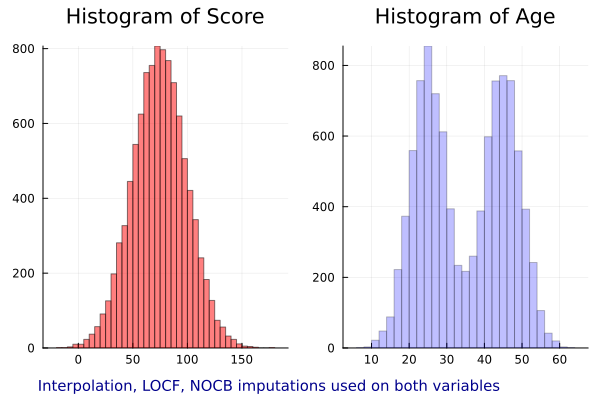

In [196]:
# try interpolation, last observation carried forward, and next observation carried backward

result_interp = copy(test_df)

result_interp[:, [:Score, :Age]] = Impute.interp(test_df[!, [:Score, :Age]]) |> 
                Impute.locf() |> 
                Impute.nocb()

h_1_interp = @df result_interp histogram(:Score, legend = false, color = :red, alpha = 0.5, title = "Histogram of Score\n")
annotate!([(175, -100, ("Interpolation, LOCF, NOCB imputations used on both variables", 10, :darkblue))])

h_2_interp = @df result_interp histogram(:Age, legend = false, color = :blue, alpha = 0.25, title = "Histogram of Age\n")

h_interp_vec = [h_1_interp h_2_interp]

plot(h_interp_vec..., size = (600,400), bottom_margin = 7mm)

## Interesting!

We see that the distributions actually responded much better in this case.

However, a look at the table itself shows us that some of those imputations could be problematic, as we get many repeated numbers.

In [105]:
# the original table

describe(test_df[:, [:Score, :Age]])

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,Union
1,Score,74.5147,-16.8624,74.4757,178.623,512,"Union{Missing, Float64}"
2,Age,35.0448,7.97581,35.0363,62.1862,491,"Union{Missing, Float64}"


In [121]:
# original table first observations

first(test_df, 25)

Row,ID,Category,Score,Age,Status
,Int64,String,Float64?,Float64?,String?
1,1,B,91.4752,22.372,Active
2,2,B,88.709,20.8739,Inactive
3,3,C,100.293,19.4022,Inactive
4,4,A,104.877,26.4894,Inactive
5,5,B,94.6277,22.3882,Active
6,6,B,82.0824,30.781,Active
7,7,A,85.5183,26.7398,Active
8,8,C,58.6678,24.5745,Inactive
9,9,B,121.236,missing,Active


In [124]:
# the new table

describe(result_interp) # indeed, no missing values in our numeric variables

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,ID,5000.5,1,5000.5,10000,0,Int64
2,Category,,A,,C,0,String
3,Score,74.5016,-16.8624,74.457,178.623,0,"Union{Missing, Float64}"
4,Age,35.0245,7.97581,34.9855,62.1862,0,"Union{Missing, Float64}"
5,Status,,Active,,Inactive,506,"Union{Missing, String}"


In [125]:
# a long view of the imputed table

first(result_interp, 25)

Row,ID,Category,Score,Age,Status
,Int64,String,Float64?,Float64?,String?
1,1,B,91.4752,22.372,Active
2,2,B,88.709,20.8739,Inactive
3,3,C,100.293,19.4022,Inactive
4,4,A,104.877,26.4894,Inactive
5,5,B,94.6277,22.3882,Active
6,6,B,82.0824,30.781,Active
7,7,A,85.5183,26.7398,Active
8,8,C,58.6678,24.5745,Inactive
9,9,B,121.236,25.1872,Active


## What if we could impute our missing values using a smarter approach that could even impute categorical variables?

Simple Random Sampling (SRS) is a method that can be used to impute missing values.  This algorithm will look at existing non-missings in the data and will randomly sample 

Let's test it out here.

In [163]:
# impute using knn

result_srs = copy(test_df)

# implement SRS imputation

result_srs = Impute.srs(result_srs)

describe(result_srs) # all variables are now complete!

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,ID,5000.5,1,5000.5,10000,0,Int64
2,Category,,A,,C,0,String
3,Score,74.5359,-16.8624,74.4834,178.623,0,"Union{Missing, Float64}"
4,Age,35.0379,7.97581,35.033,62.1862,0,"Union{Missing, Float64}"
5,Status,,Active,,Inactive,0,"Union{Missing, String}"


## Check the distribution after the use of SRS imputation!

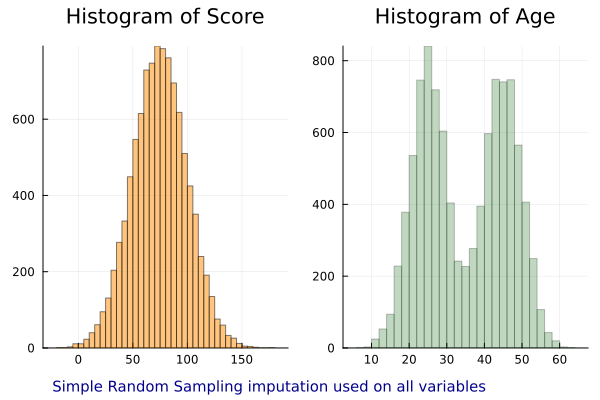

In [197]:
# create the histograms
h_1_srs = @df result_srs histogram(:Score, legend = false, color = :darkorange, alpha = 0.5, title = "Histogram of Score\n")
annotate!([(175, -100, ("Simple Random Sampling imputation used on all variables", 10, :darkblue))])

h_2_srs = @df result_srs histogram(:Age, legend = false, color = :darkgreen, alpha = 0.25, title = "Histogram of Age\n")

h_srs_vec = [h_1_srs h_2_srs]

plot(h_srs_vec..., size = (600,400), bottom_margin = 7mm)

## Check the distribution of Score among different Categories and Statuses

We can check the distribution of Score among the the categorical variables using grouped bar plots

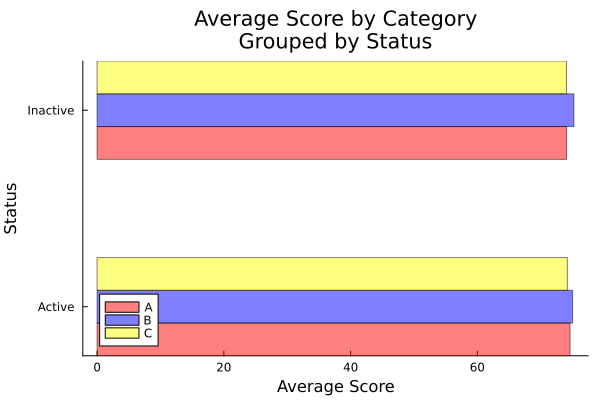

In [229]:
# Calculate the average score for each category and status
average_scores = combine(groupby(result_srs, [:Category, :Status]), :Score => mean => :AverageScore)

# Sort by average score in descending order
sorted_scores = sort(average_scores, :AverageScore, rev=false)

# Create a horizontal bar plot
groupedbar(
    sorted_scores.Status, 
    sorted_scores.AverageScore,
    group = sorted_scores.Category, 
    title="Average Score by Category\nGrouped by Status\n", 
    xlabel="Status", 
    ylabel="Average Score",
    legend = :bottomleft,
    bar_width = 0.5,  # Control the spacing between bars
    grid = false,
    alpha = 0.5,
    color = [:red :blue :yellow],
    permute = (:x, :y)
)

## A Direct comparison between the imputed distributions

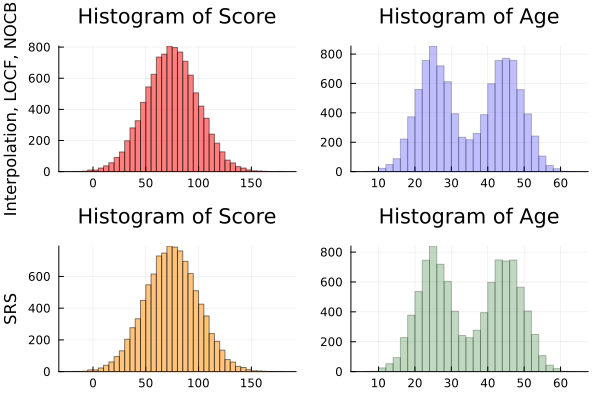

In [199]:
# recreate the first plot of each set without the annotation
h_1_interp = @df result_interp histogram(:Score, legend = false, color = :red, alpha = 0.5, title = "Histogram of Score\n", ylab = "Interpolation, LOCF, NOCB")

h_1_srs = @df result_srs histogram(:Score, legend = false, color = :darkorange, alpha = 0.5, title = "Histogram of Score\n", ylab = "SRS")

# create the new vector with all imputed distributions

imputed_vector = [h_1_interp h_2_interp h_1_srs h_2_srs]

plot(imputed_vector...)

## Finally, a scatterplot of the numeric variables with a regression model

It would be helpful to see how our imputation methods performed with regard to how they affected the relationship between the variables.

We can use a correlation matrix, and also scatterplots to check this.

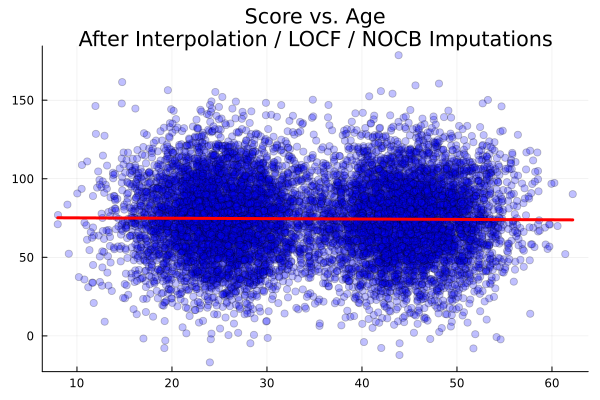

In [227]:
# work on the Interpolation / LOCF / NOCB

scatter_1 = @df result_interp scatter(:Age, 
:Score, 
smooth = true,
 markercolor = :blue, 
 markeralpha = 0.25, 
 linecolor = :red, 
 linewidth = 3,
 legend = false,
 title = "Score vs. Age\nAfter Interpolation / LOCF / NOCB Imputations"
 )


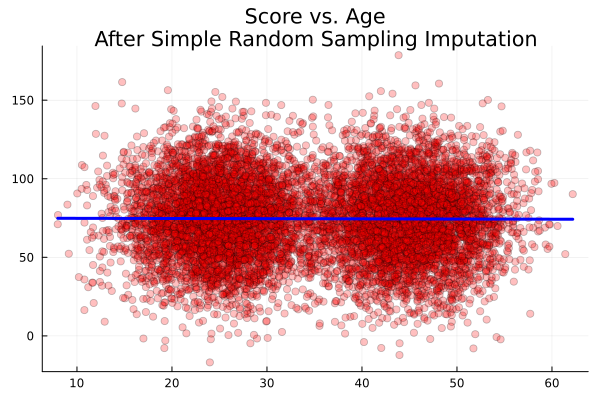

In [228]:
# now the SRS model

scatter_2 = @df result_srs scatter(:Age, :Score, 
smooth = true, 
markercolor = :red, 
markeralpha = 0.25, 
linecolor = :blue, 
linewidth = 3,
legend = false,
title = "Score vs. Age\nAfter Simple Random Sampling Imputation"
)

# Conclusion

Overall, the `Impute.jl` package provides great support to data scientists using Julia for a common task in your analytics workflow: dealing with missing values.

Take time to explore other algorithms that `Impute.jl` provides, such as KNN, Replace, and Substitute (you can do mean / median, etc. substitution using Substitute).

I hope this notebook was helpful, and I welcome your feedback!